In [22]:
%matplotlib inline
import math
import torch
from torch import nn
from torch.nn import functional as Func
from d2l import torch as d2l
import matplotlib.pyplot as plt
import collections
import re
from torch.utils.data import DataLoader, TensorDataset

In [23]:
class Basic_RNN_Implementation(d2l.Module):
  def __init__(self, num_of_inputs, num_hiddens, sigma=0.01):
    super().__init__()
    self.save_hyperparameters()
    self.input_to_hidden_weights = nn.Parameter(torch.randn(num_of_inputs, num_hiddens) * sigma)
    self.hidden_to_hidden_weights = nn.Parameter(torch.randn(num_hiddens, num_hiddens) * sigma)
    self.hidden_bias = nn.Parameter(torch.zeros(num_hiddens))

In [24]:
@d2l.add_to_class(Basic_RNN_Implementation)
def forward(self, inputs, state = None):
  if state is None:
    state = torch.zeros((inputs.shape[1], self.num_hiddens),
      device=inputs.device)
  else:
    state, = state
  outputs = []

  for i in inputs:
    state = torch.tanh(torch.matmul(i, self.input_to_hidden_weights) + torch.matmul(state, self.hidden_to_hidden_weights) + self.hidden_bias)
    outputs.append(state)

  return outputs, state

In [25]:
# Minibatch
batch_size, num_of_inputs, num_hiddens, num_of_steps = 2, 16, 32, 100
rnn = Basic_RNN_Implementation(num_of_inputs, num_hiddens)
i = torch.ones((num_of_steps, batch_size, num_of_inputs))
outputs, state = rnn(i)

In [26]:
def check_len(a, n):
    assert len(a) == n, f'list\'s length {len(a)} != expected length {n}'

def check_shape(a, shape):
    assert a.shape == shape, \
            f'tensor\'s shape {a.shape} != expected shape {shape}'

check_len(outputs, num_of_steps)
check_shape(outputs[0], (batch_size, num_hiddens))
check_shape(state, (batch_size, num_hiddens))

In [27]:
class Basic_RNN_LM(d2l.Classifier):
    def __init__(self, rnn, vocab_size, lr=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.init_params()
        self.train_perplexity = []  # Store training perplexity
        self.val_perplexity = []  # Store validation perplexity

    def init_params(self):
        self.hidden_to_vocab_weights = nn.Parameter(
            torch.randn(self.rnn.num_hiddens, self.vocab_size) * self.rnn.sigma
        )
        self.output_bias = nn.Parameter(torch.zeros(self.vocab_size))

    def training_step(self, batch):
        predicted_output = self(*batch[:-1])
        target_output = batch[-1]
        loss = self.loss(predicted_output, target_output)
        perplexity = torch.exp(loss)

        # Store training perplexity
        self.train_perplexity.append(perplexity.item())
        self.plot('perplexity', perplexity, train=True)

        return loss

    def validation_step(self, batch):
        predicted_output = self(*batch[:-1])
        target_output = batch[-1]
        loss = self.loss(predicted_output, target_output)
        perplexity = torch.exp(loss)

        # Store validation perplexity
        self.val_perplexity.append(perplexity.item())
        print(f"Training Perplexity (Epoch {len(self.train_perplexity)}): {perplexity.item():.4f}")
        self.plot('perplexity', perplexity, train=False)

        return loss

In [28]:
# One-Hot Encoding
@d2l.add_to_class(Basic_RNN_LM)
def one_hot(self, X):
    return Func.one_hot(X.T, self.vocab_size).type(torch.float32)

In [29]:
# Transforming RNN outputs
@d2l.add_to_class(Basic_RNN_LM)
def output_layer(self, rnn_outputs):
    outputs = [torch.matmul(H, self.hidden_to_vocab_weights) + self.output_bias for H in rnn_outputs]
    return torch.stack(outputs, 1)

@d2l.add_to_class(Basic_RNN_LM)
def forward(self, X, state=None):
    embs = self.one_hot(X)
    rnn_outputs, _ = self.rnn(embs, state)
    return self.output_layer(rnn_outputs)

In [30]:
#Check the ouput if its in the correct shape
model = Basic_RNN_LM(rnn, num_of_inputs)
outputs = model(torch.ones((batch_size, num_of_steps), dtype=torch.int64))
check_shape(outputs, (batch_size, num_of_steps, num_of_inputs))

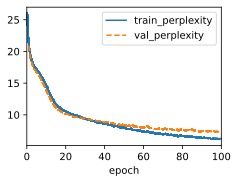

In [31]:
# First training using the Time-Machine Dataset
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
rnn = Basic_RNN_Implementation(num_of_inputs=len(data.vocab), num_hiddens=32)
model = Basic_RNN_LM(rnn, vocab_size=len(data.vocab), lr=1)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)

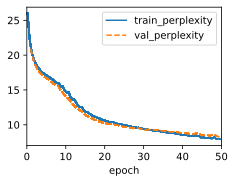

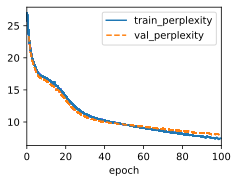

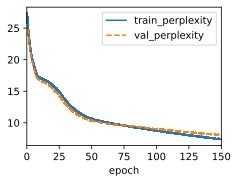

In [32]:
# Define different hyperparameter configurations
configs = [
    {'num_hiddens': 32, 'num_steps': 32, 'lr': 1.0, 'max_epochs': 50},   # Model 1
    {'num_hiddens': 64, 'num_steps': 64, 'lr': 0.5, 'max_epochs': 100},   # Model 2
    {'num_hiddens': 128, 'num_steps': 128, 'lr': 0.3, 'max_epochs': 150},  # Model 3
]

# Store results
train_perplexities = {}
val_perplexities = {}

for i, config in enumerate(configs):
    print(f" Training Model {i+1} with Config: {config}")

    # Load dataset
    data = d2l.TimeMachine(batch_size=1024, num_steps=config['num_steps'])

    # Define RNN model
    rnn = Basic_RNN_Implementation(num_of_inputs=len(data.vocab), num_hiddens=config['num_hiddens'])
    model = Basic_RNN_LM(rnn, vocab_size=len(data.vocab), lr=config['lr'])

    # Train model
    trainer = d2l.Trainer(max_epochs=config['max_epochs'], gradient_clip_val=1, num_gpus=0)
    trainer.fit(model, data)

    # Store perplexity results
    train_perplexities[f"Model {i+1}"] = model.train_perplexity
    val_perplexities[f"Model {i+1}"] = model.val_perplexity


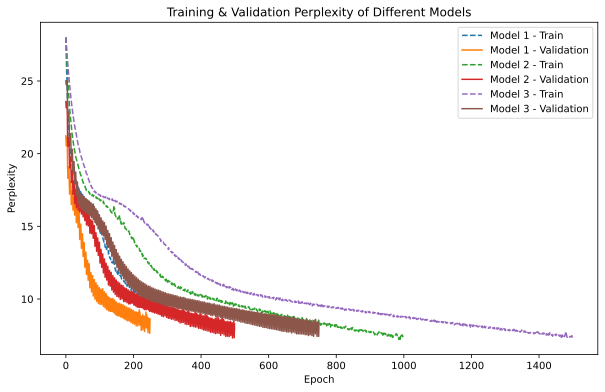

In [33]:
plt.figure(figsize=(10, 6))

for model_name in train_perplexities.keys():
    plt.plot(train_perplexities[model_name],linestyle="dashed", label=f"{model_name} - Train")
    plt.plot(val_perplexities[model_name], label=f"{model_name} - Validation")

plt.xlabel("Epoch")
plt.ylabel("Perplexity")
plt.title("Training & Validation Perplexity of Different Models")
plt.legend()
plt.show()


In [34]:
# Find the best model (lowest final validation perplexity)Basic_RNN_LM
best_model = min(val_perplexities, key=lambda x: val_perplexities[x][-1])

print(f"Best Model: {best_model}")
print(f"Lowest Validation Perplexity: {val_perplexities[best_model][-1]}")


Best Model: Model 2
Lowest Validation Perplexity: 8.275206565856934


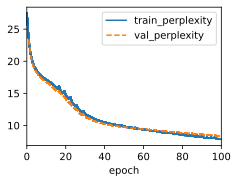

In [35]:
# Train model WITHOUT gradient clipping
data = d2l.TimeMachine(batch_size=2000, num_steps=32)
rnn = Basic_RNN_Implementation(num_of_inputs=len(data.vocab), num_hiddens=32)
model_no_clip = Basic_RNN_LM(rnn, vocab_size=len(data.vocab), lr=1)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=0, num_gpus=1)
trainer.fit(model_no_clip, data)

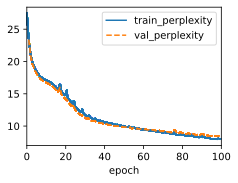

In [36]:
# Train model WITH gradient clipping
data = d2l.TimeMachine(batch_size=2000, num_steps=32)
rnn = Basic_RNN_Implementation(num_of_inputs=len(data.vocab), num_hiddens=32)
model_with_clip = Basic_RNN_LM(rnn, vocab_size=len(data.vocab), lr=1)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model_with_clip, data)


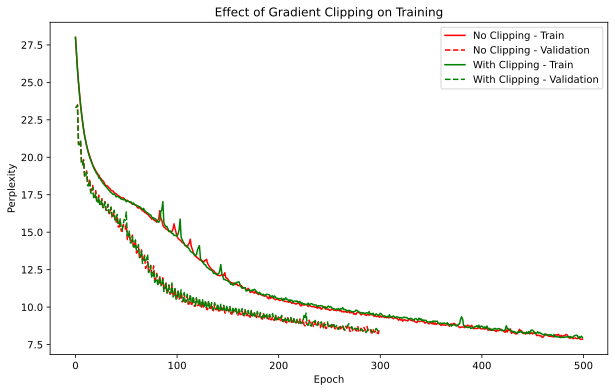

In [37]:
# Extract perplexity values
train_perplexity_no_clip = model_no_clip.train_perplexity
val_perplexity_no_clip = model_no_clip.val_perplexity

train_perplexity_with_clip = model_with_clip.train_perplexity
val_perplexity_with_clip = model_with_clip.val_perplexity

# Plot results
plt.figure(figsize=(10, 6))

plt.plot(train_perplexity_no_clip, label="No Clipping - Train", color="red")
plt.plot(val_perplexity_no_clip, linestyle="dashed", label="No Clipping - Validation", color="red")

plt.plot(train_perplexity_with_clip, label="With Clipping - Train", color="green")
plt.plot(val_perplexity_with_clip, linestyle="dashed", label="With Clipping - Validation", color="green")

plt.xlabel("Epoch")
plt.ylabel("Perplexity")
plt.title("Effect of Gradient Clipping on Training")
plt.legend()
plt.show()


In [38]:
class Basic_RNN_Implementation_with_RELU(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.input_to_hidden_weights = nn.Parameter(torch.randn(num_inputs, num_hiddens) * sigma)
        self.hidden_to_hidden_weights = nn.Parameter(torch.randn(num_hiddens, num_hiddens) * sigma)
        self.hidden_bias = nn.Parameter(torch.zeros(num_hiddens))

    def forward(self, inputs, state=None):
        if state is None:
            state = torch.zeros((inputs.shape[1], self.num_hiddens), device=inputs.device)
        else:
            state, = state
        outputs = []

        for i in inputs:
            # 🔹 Using ReLU instead of Tanh
            state = torch.relu(torch.matmul(i, self.input_to_hidden_weights) +
                               torch.matmul(state, self.hidden_to_hidden_weights) + self.hidden_bias)
            outputs.append(state)

        return outputs, state


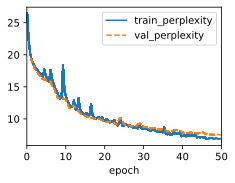

In [39]:
print("\n Training RNN with ReLU (No Gradient Clipping)...")

data = d2l.TimeMachine(batch_size=2000, num_steps=32)
rnn_relu_no_clip = Basic_RNN_Implementation_with_RELU(num_inputs=len(data.vocab), num_hiddens=64)
model_relu_no_clip = Basic_RNN_LM(rnn_relu_no_clip, vocab_size=len(data.vocab), lr=3.0)
Basic_RNN_LM
trainer_relu_no_clip = d2l.Trainer(max_epochs=50, gradient_clip_val=0, num_gpus=0)  # No Clipping
trainer_relu_no_clip.fit(model_relu_no_clip, data)


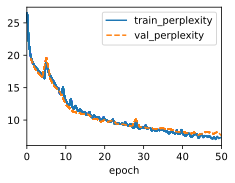

In [40]:
print("\n Training RNN with ReLU (With Gradient Clipping)...")
data = d2l.TimeMachine(batch_size=2000, num_steps=32)
rnn_relu_clip = Basic_RNN_Implementation_with_RELU(num_inputs=len(data.vocab), num_hiddens=64)
model_relu_clip = Basic_RNN_LM(rnn_relu_clip, vocab_size=len(data.vocab), lr=3.0)

trainer_relu_clip = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=0)  # With Clipping
trainer_relu_clip.fit(model_relu_clip, data)


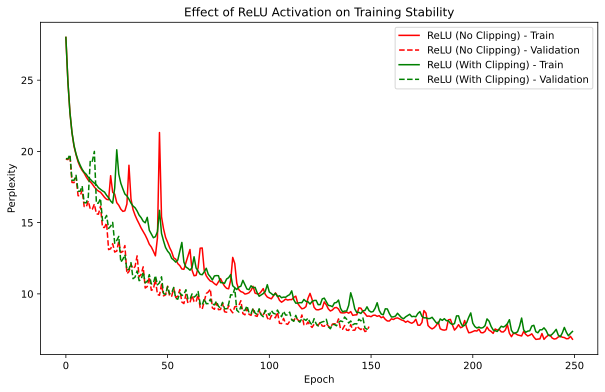

In [41]:
# Extract perplexity values
train_perplexity_relu_no_clip = model_relu_no_clip.train_perplexity
val_perplexity_relu_no_clip = model_relu_no_clip.val_perplexity

train_perplexity_relu_clip = model_relu_clip.train_perplexity
val_perplexity_relu_clip = model_relu_clip.val_perplexity

# Plot results
plt.figure(figsize=(10, 6))

plt.plot(train_perplexity_relu_no_clip, label="ReLU (No Clipping) - Train", color="red")
plt.plot(val_perplexity_relu_no_clip, linestyle="dashed", label="ReLU (No Clipping) - Validation", color="red")

plt.plot(train_perplexity_relu_clip, label="ReLU (With Clipping) - Train", color="green")
plt.plot(val_perplexity_relu_clip, linestyle="dashed", label="ReLU (With Clipping) - Validation", color="green")

plt.xlabel("Epoch")
plt.ylabel("Perplexity")
plt.title("Effect of ReLU Activation on Training Stability")
plt.legend()
plt.show()


In [42]:
class GRUBasic(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()
    
        # Helper function to initialize weights
        def init_weight(*shape):
            return nn.Parameter(torch.randn(*shape) * sigma)
    
        # Helper function to create a set of weights and biases for a gate
        def create_gate_params():
            return (
                init_weight(num_inputs, num_hiddens),  # Input-to-hidden weights
                init_weight(num_hiddens, num_hiddens),  # Hidden-to-hidden weights
                nn.Parameter(torch.zeros(num_hiddens)))  # Bias
                
        # Initialize parameters for the update gate
        self.update_input_weights, self.update_hidden_weights, self.update_bias = create_gate_params()
    
        # Initialize parameters for the reset gate
        self.reset_input_weights, self.reset_hidden_weights, self.reset_bias = create_gate_params()
    
        # Initialize parameters for the candidate hidden state
        self.candidate_input_weights, self.candidate_hidden_weights, self.candidate_bias = create_gate_params()

In [43]:
@d2l.add_to_class(GRUBasic)
def forward(self, inputs, hidden_state=None):
    if hidden_state is None:
        hidden_state = torch.zeros((inputs.shape[1], self.num_hiddens), device=inputs.device)
    
    outputs = []

    for input_tensor in inputs:
        update_gate = torch.sigmoid(
            torch.matmul(input_tensor, self.update_input_weights) +
            torch.matmul(hidden_state, self.update_hidden_weights) +
            self.update_bias
        )

        reset_gate = torch.sigmoid(
            torch.matmul(input_tensor, self.reset_input_weights) +
            torch.matmul(hidden_state, self.reset_hidden_weights) +
            self.reset_bias
        )

        candidate_state = torch.tanh(
            torch.matmul(input_tensor, self.candidate_input_weights) +
            torch.matmul(reset_gate * hidden_state, self.candidate_hidden_weights) +
            self.candidate_bias
        )

        hidden_state = update_gate * hidden_state + (1 - update_gate) * candidate_state
        outputs.append(hidden_state)

    return outputs, hidden_state

Final Training Perplexity: 6.1858
Final Validation Perplexity: 7.2434
Total Training Time: 68.91 sec
Total time for all epochs in GRU Model 1: 26.00 sec
Total time for all epochs in GRU Model 2: 33.49 sec
Total time for all epochs in GRU Model 3: 68.91 sec


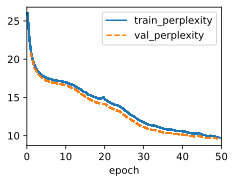

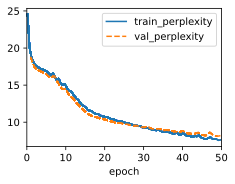

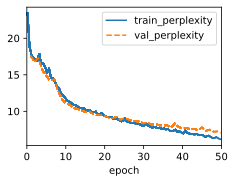

In [44]:
import time

# Define different hyperparameter configurations
gru_configs = [
    {'num_hiddens': 32, 'num_steps': 32, 'lr': 1.0, 'max_epochs': 50},   # Model 1
    {'num_hiddens': 64, 'num_steps': 32, 'lr': 2.0, 'max_epochs': 50},   # Model 2
    {'num_hiddens': 128, 'num_steps': 64, 'lr': 3.0, 'max_epochs': 50},  # Model 3
]

# Store results
train_perplexities = {}
val_perplexities = {}
epoch_times = {}  # Store time taken for each epoch
total_epoch_times = {}  # Store the total time for each model

for i, config in enumerate(gru_configs):
    print(f"\n🔹 Training GRU Model {i+1} - Hidden: {config['num_hiddens']}, LR: {config['lr']}")

    # Load dataset
    data = d2l.TimeMachine(batch_size=1024, num_steps=config['num_steps'])

    # Define GRU model
    gru = GRUBasic(num_inputs=len(data.vocab), num_hiddens=config["num_hiddens"])
    model = Basic_RNN_LM(gru, vocab_size=len(data.vocab), lr=config["lr"])

    # Set up Trainer with Gradient Clipping
    trainer = d2l.Trainer(max_epochs=config["max_epochs"], gradient_clip_val=1, num_gpus=0)

    # Reset perplexity lists for each model
    model.train_perplexity = []
    model.val_perplexity = []

    # Track time for each epoch
    epoch_times_model = []

    # Override the fit_epoch method to measure time per epoch
    original_fit_epoch = trainer.fit_epoch

    def fit_epoch_with_timing():
        start_time = time.time()
        original_fit_epoch()
        epoch_time = time.time() - start_time  # Calculate time taken for the epoch
        epoch_times_model.append(epoch_time)  # Store epoch time

    trainer.fit_epoch = fit_epoch_with_timing  # Replace fit_epoch with the timed version

    # Measure total training time
    start_time = time.time()
    trainer.fit(model, data)  # Train the model
    end_time = time.time()

    # Calculate total time taken for all epochs in this model
    total_time_model = sum(epoch_times_model)
    total_epoch_times[f"GRU Model {i+1}"] = total_time_model

    # 🔹 Store perplexity results
    train_perplexities[f"GRU Model {i+1}"] = model.train_perplexity
    val_perplexities[f"GRU Model {i+1}"] = model.val_perplexity
    epoch_times[f"GRU Model {i+1}"] = epoch_times_model

    # Print final results for the model
    print(f"Final Training Perplexity: {train_perplexities[f'GRU Model {i+1}'][-1]:.4f}")
    print(f"Final Validation Perplexity: {val_perplexities[f'GRU Model {i+1}'][-1]:.4f}")
    print(f"Total Training Time: {end_time - start_time:.2f} sec")

# Print total epoch time for each model after training
for i, config in enumerate(gru_configs):
    print(f"Total time for all epochs in GRU Model {i+1}: {total_epoch_times[f'GRU Model {i+1}']:.2f} sec")


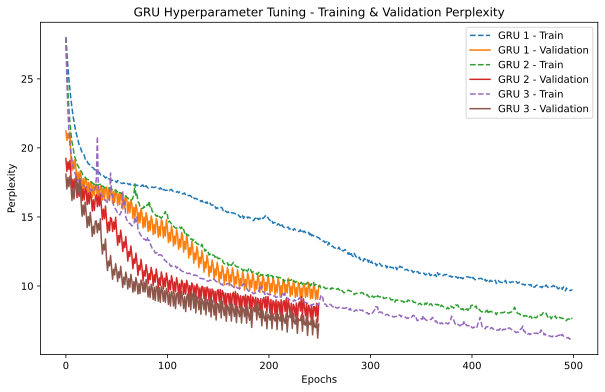

In [45]:
# Plot training & validation perplexity for different models
plt.figure(figsize=(10, 6))

for i in range(3):
    plt.plot(train_perplexities[f"GRU Model {i+1}"],linestyle="dashed", label=f"GRU {i+1} - Train")
    plt.plot(val_perplexities[f"GRU Model {i+1}"], label=f"GRU {i+1} - Validation")

plt.xlabel("Epochs")
plt.ylabel("Perplexity")
plt.title("GRU Hyperparameter Tuning - Training & Validation Perplexity")
plt.legend()
plt.show()


In [46]:
@d2l.add_to_class(Basic_RNN_LM)
def predict(self, prefix, num_preds, vocab, device=None):
    state, outputs = None, [vocab[prefix[0]]]
    for i in range(len(prefix) + num_preds - 1):
        X = torch.tensor([[outputs[-1]]], device=device)
        embs = self.one_hot(X)
        rnn_outputs, state = self.rnn(embs, state)
        if i < len(prefix) - 1:  # Warm-up period
            outputs.append(vocab[prefix[i + 1]])
        else:  # Predict num_preds steps
            Y = self.output_layer(rnn_outputs)
            outputs.append(int(Y.argmax(axis=2).reshape(1)))
    return ''.join([vocab.idx_to_token[i] for i in outputs])

In [47]:
# Had to use this, otherwise my model kept crashing
@d2l.add_to_class(d2l.Trainer)
def clip_gradients(self, grad_clip_val, model):
    """Clip gradients to prevent exploding gradients."""
    params = [p for p in model.parameters() if p.requires_grad and p.grad is not None]  #Skip None gradients
    if len(params) == 0:
        print("Warning: No gradients found. Skipping gradient clipping.")
        return  # Skip if no valid gradients
    norm = torch.sqrt(sum(torch.sum((p.grad ** 2)) for p in params))
    if norm > grad_clip_val:
        for param in params:
            param.grad[:] *= grad_clip_val / norm    


In [48]:
def forward_reset_only(self, inputs, H=None):
    if H is None:
        H = torch.zeros((inputs.shape[1], self.num_hiddens), device=inputs.device)
    outputs = []
    for X in inputs:
        R = torch.sigmoid(
            torch.matmul(X, self.reset_input_weights) +
            torch.matmul(H, self.reset_hidden_weights) +
            self.reset_bias
        )  # Reset gate
        H_tilde = torch.tanh(
            torch.matmul(X, self.candidate_input_weights) +
            torch.matmul(R * H, self.candidate_hidden_weights) +
            self.candidate_bias
        )  # Candidate state
        H = H_tilde + H  # Ignore update gate but retain some memory
        outputs.append(H)
    return outputs, H

In [49]:
def forward_update_only(self, inputs, H=None):
    if H is None:
        H = torch.zeros((inputs.shape[1], self.num_hiddens), device=inputs.device)
    outputs = []
    for X in inputs:
        Z = torch.sigmoid(
            torch.matmul(X, self.update_input_weights) +
            torch.matmul(H, self.update_hidden_weights) +
            self.update_bias
        )  # Update gate
        H_tilde = torch.tanh(
            torch.matmul(X, self.candidate_input_weights) +
            torch.matmul(H, self.candidate_hidden_weights) +
            self.candidate_bias
        )  # Candidate state
        H = Z * H + (1 - Z) * H_tilde  # Ignore reset gate
        outputs.append(H)
    return outputs, H

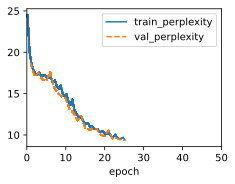

In [ ]:
import time

# Define the training loop for GRU variants
def train_gru_variant(variant_name, forward_fn, config):
    print(f"\n🔹 Training {variant_name} - Hidden: {config['num_hiddens']}, LR: {config['lr']}")

    # Load dataset
    data = d2l.TimeMachine(batch_size=1024, num_steps=config['num_steps'])

    # Define GRU model
    gru = GRUBasic(num_inputs=len(data.vocab), num_hiddens=config["num_hiddens"])
    gru.forward = forward_fn.__get__(gru)  # Override forward method
    model = Basic_RNN_LM(gru, vocab_size=len(data.vocab), lr=config["lr"])

    # Set up Trainer with Gradient Clipping
    trainer = d2l.Trainer(max_epochs=config["max_epochs"], gradient_clip_val=1, num_gpus=0)

    # Track time for each epoch
    epoch_times_variant = []

    # Override the fit_epoch method to measure time per epoch
    original_fit_epoch = trainer.fit_epoch

    def fit_epoch_with_timing():
        start_time = time.time()
        original_fit_epoch()
        epoch_time = time.time() - start_time  # Calculate time taken for the epoch
        epoch_times_variant.append(epoch_time)  # Store epoch time

    trainer.fit_epoch = fit_epoch_with_timing  # Replace fit_epoch with the timed version

    # Measure total training time
    start_time = time.time()
    trainer.fit(model, data)
    end_time = time.time()

    # Store perplexity results
    train_perplexity = model.train_perplexity
    val_perplexity = model.val_perplexity
    total_epoch_time = sum(epoch_times_variant)

    # Print final results
    print(f" Final Training Perplexity: {train_perplexity[-1]:.4f}")
    print(f" Final Validation Perplexity: {val_perplexity[-1]:.4f}")
    print(f" Total Epoch Time: {total_epoch_time:.2f} sec")
    print(f" Total Training Time: {end_time - start_time:.2f} sec")

    return train_perplexity, val_perplexity, total_epoch_time

# Define hyperparameters
config = {'num_hiddens': 64, 'num_steps': 32, 'lr': 2.0, 'max_epochs': 50}

# Train and evaluate all variants
variants = {
    "Full GRU": GRUBasic.forward,
    "Reset Gate Only": forward_reset_only,
    "Update Gate Only": forward_update_only,
}

results = {}
for variant_name, forward_fn in variants.items():
    train_perplexity, val_perplexity, total_epoch_time = train_gru_variant(variant_name, forward_fn, config)
    results[variant_name] = {
        "train_perplexity": train_perplexity,
        "val_perplexity": val_perplexity,
        "total_epoch_time": total_epoch_time,
    }

# Print the total epoch time for each variant
for variant_name, result in results.items():
    print(f"Total time for all epochs in {variant_name}: {result['total_epoch_time']:.2f} sec")

# Plot perplexity curves
plt.figure(figsize=(12, 6))
for variant_name, result in results.items():
    plt.plot(result["train_perplexity"], label=f"{variant_name} (Train)")
    plt.plot(result["val_perplexity"], linestyle="--", label=f"{variant_name} (Val)")
plt.xlabel("Epoch")
plt.ylabel("Perplexity")
plt.title("Training and Validation Perplexity")
plt.legend()
plt.grid()
plt.show()


In [177]:
def generate_sequence(model, data, prefix, num_predict, device='cpu'):
    model.eval()  # Set model to evaluation mode
    model.to(device)  # Move model to the specified device

    # Convert prefix tokens to indices
    prefix_tokens = [data.vocab[token] if token in data.vocab.token_to_idx else data.vocab['<unk>'] for token in prefix]
    output = prefix_tokens
    H = None  # Initialize hidden state

    for _ in range(num_predict):
        # Prepare input tensor
        X = torch.tensor([output[-1]], device=device).reshape(1, 1)

        # Forward pass
        with torch.no_grad():
            result = model(X, H)  # Adjusted to get outputs
            if isinstance(result, tuple):
                outputs, H = result  # Get outputs and updated hidden state if result is a tuple
                if isinstance(H, tuple):  # If the hidden state is a tuple (e.g., for LSTM)
                    H = tuple([h.to(device) for h in H])
                else:
                    H = H.to(device)
            else:
                outputs = result  # If result is not a tuple, assume it to be the outputs

            Y = outputs[-1]  # Use the last output for prediction

        # Predict next token
        predicted_idx = int(Y.argmax(dim=-1).squeeze().item())
        output.append(predicted_idx)

    # Convert token indices back to text
    sequence = "".join([data.vocab.idx_to_token[i] if i < len(data.vocab.idx_to_token) else '?' for i in output])

    return sequence

# Set device
device = d2l.try_gpu()

# Define prefix and number of tokens to predict
prefix = "it has"
num_predict = 20

# Generate sequence
generated_sequence = generate_sequence(model, data, prefix, num_predict, device)
print(generated_sequence)


it has al al al al al al a
